<a href="https://colab.research.google.com/github/CrisGiacomazzi/AB-Test/blob/main/AB_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub

path = kagglehub.dataset_download('mexwell/employee-performance-and-productivity-data')

print('Path to dataset files:', path)

100%|██████████| 2.39M/2.39M [00:00<00:00, 26.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mexwell/employee-performance-and-productivity-data/versions/1


In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import ks_2samp

!pip install -q powerbiclient
from powerbiclient import QuickVisualize, get_dataset_config, Report
from powerbiclient.authentication import DeviceCodeLoginAuthentication

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.9/684.9 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.2/113.2 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.6 MB/s eta 0:00:00


In [ ]:
# Discovering the dataset name
print('Files in the dataset folder:', os.listdir(path))

Files in the dataset folder: ['Extended_Employee_Performance_and_Productivity_Data.csv']


In [ ]:
# Load the dataset into a variable
file_name = 'Extended_Employee_Performance_and_Productivity_Data.csv'
employee_dataset = pd.read_csv(f'{path}/{file_name}')

# Display the first few rows of the dataset
# print(employee_dataset.head())

In [ ]:
employee_dataset.shape

(100000, 20)

In [ ]:
# Understand variable type
employee_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Employee_ID                  100000 non-null  int64  
 1   Department                   100000 non-null  object 
 2   Gender                       100000 non-null  object 
 3   Age                          100000 non-null  int64  
 4   Job_Title                    100000 non-null  object 
 5   Hire_Date                    100000 non-null  object 
 6   Years_At_Company             100000 non-null  int64  
 7   Education_Level              100000 non-null  object 
 8   Performance_Score            100000 non-null  int64  
 9   Monthly_Salary               100000 non-null  float64
 10  Work_Hours_Per_Week          100000 non-null  int64  
 11  Projects_Handled             100000 non-null  int64  
 12  Overtime_Hours               100000 non-null  int64  
 13  

In [ ]:
employee_dataset.describe()

,Employee_ID,Age,Years_At_Company,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,41.029410,4.476070,2.995430,6403.211000,44.956950,24.431170,14.514930,7.008550,50.090500,10.013560,49.506060,0.999720,2.999088
std,28867.657797,11.244121,2.869336,1.414726,1372.508717,8.942003,14.469584,8.664026,4.331591,35.351157,5.495405,28.890383,0.815872,1.150719
min,1.000000,22.000000,0.000000,1.000000,3850.000000,30.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
25%,25000.750000,31.000000,2.000000,2.000000,5250.000000,37.000000,12.000000,7.000000,3.000000,25.000000,5.000000,25.000000,0.000000,2.010000
50%,50000.500000,41.000000,4.000000,3.000000,6500.000000,45.000000,24.000000,15.000000,7.000000,50.000000,10.000000,49.000000,1.000000,3.000000
75%,75000.250000,51.000000,7.000000,4.000000,7500.000000,53.000000,37.000000,22.000000,11.000000,75.000000,15.000000,75.000000,2.000000,3.990000
max,100000.000000,60.000000,10.000000,5.000000,9000.000000,60.000000,49.000000,29.000000,14.000000,100.000000,19.000000,99.000000,2.000000,5.000000


In [ ]:
employee_dataset.head()

,Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,False
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,False
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,False
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,False
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,False


##**Dataset Preprocessing**

In [ ]:
# Convert 'Hire Date' column to datetime objects
employee_dataset['Hire_Date'] = pd.to_datetime(employee_dataset['Hire_Date'])

# Filter data for 2019 and 2020
employee20192020_dataset = employee_dataset[
    (employee_dataset['Hire_Date'].dt.year == 2019) | (employee_dataset['Hire_Date'].dt.year == 2020)
]

# Display the first few rows of the new dataset
#print(employee20192020_dataset.head())

In [ ]:
employee20192020_dataset.shape

(20032, 20)

In [ ]:
duplicate_rows = employee20192020_dataset.duplicated()
print('Duplicate Rows:')
duplicate_rows

Duplicate Rows:


,0
10,False
12,False
16,False
34,False
35,False
...,...
99969,False
99974,False
99979,False
99986,False


In [ ]:
employee20192020_dataset.drop_duplicates(inplace=True)

<ipython-input-14-99f745b22541>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  employee20192020_dataset.drop_duplicates(inplace=True)


In [ ]:
print(employee20192020_dataset.isnull().sum())

Employee_ID                    0
Department                     0
Gender                         0
Age                            0
Job_Title                      0
Hire_Date                      0
Years_At_Company               0
Education_Level                0
Performance_Score              0
Monthly_Salary                 0
Work_Hours_Per_Week            0
Projects_Handled               0
Overtime_Hours                 0
Sick_Days                      0
Remote_Work_Frequency          0
Team_Size                      0
Training_Hours                 0
Promotions                     0
Employee_Satisfaction_Score    0
Resigned                       0
dtype: int64


##**Feature engineering**

In [ ]:
# Creating groups for comparison test:
employee20192020_dataset['group'] = employee20192020_dataset['Hire_Date'].dt.year.apply(lambda year: 1 if year == 2019 else 2)

<ipython-input-16-403d5c94eb2e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  employee20192020_dataset['group'] = employee20192020_dataset['Hire_Date'].dt.year.apply(lambda year: 1 if year == 2019 else 2)


##**Exploratory Data Analysis**

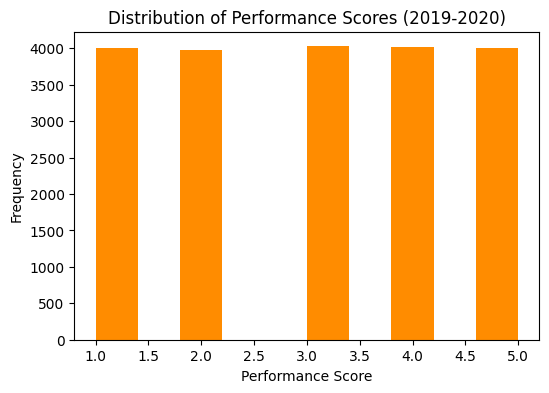

In [ ]:
# Distribution of Performance Score among 2019 and 2020
plt.figure(figsize=(6, 4))
plt.hist(employee20192020_dataset['Performance_Score'], bins=10, color='darkorange')
plt.xlabel('Performance Score')
plt.ylabel('Frequency')
plt.title('Distribution of Performance Scores (2019-2020)')
plt.show()

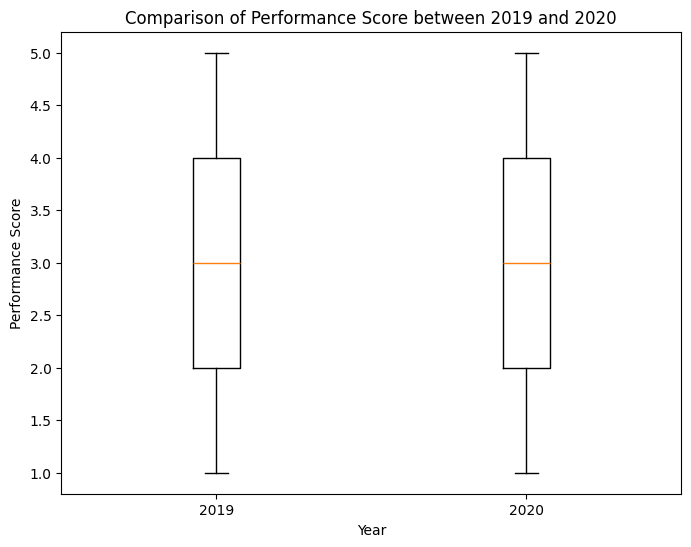

In [ ]:
# Box plot comparing the average between 2019 and 2020
plt.figure(figsize=(8, 6))
plt.boxplot([employee20192020_dataset[employee20192020_dataset['Hire_Date'].dt.year == 2019]['Performance_Score'],
             employee20192020_dataset[employee20192020_dataset['Hire_Date'].dt.year == 2020]['Performance_Score']],
            labels=['2019', '2020'])
plt.xlabel('Year')
plt.ylabel('Performance Score')
plt.title('Comparison of Performance Score between 2019 and 2020')
plt.show()

Apparently, there is no difference among the traning between 2019 and 2020. However, we can performance calculations to be more confident in the assumption.

##**Normality Test**
###Kolmogorov–Smirnov Test (dataset shape has 20032 observations)

In [ ]:
# Kolmogorov–Smirnov test
def perform_ks_test(data, group_col, value_col):
    # Separate the groups
    groups = data[group_col].unique()
    if len(groups) != 2:
        raise ValueError('Kolmogorov–Smirnov test requires exactly two groups.')

    group1 = data[data[group_col] == groups[0]][value_col]
    group2 = data[data[group_col] == groups[1]][value_col]

    # Perform the K-S test
    test_stat, p_value = ks_2samp(group1, group2)
    return test_stat, p_value

# Run the K-S test
try:
    test_statistic, p_value = perform_ks_test(employee20192020_dataset, group_col='group', value_col='Performance_Score')

    # Output the results
    print('Kolmogorov–Smirnov test statistic:', test_statistic)
    print('p-value:', p_value)

    # Interpret the result
    if p_value < 0.05:
        print('Reject the null hypothesis: The distributions of the two groups are significantly different.')
    else:
        print('Fail to reject the null hypothesis: The distributions of the two groups are not significantly different.')
except ValueError as e:
    print("Error:", e)

Kolmogorov–Smirnov test statistic: 0.011676153691071334
p-value: 0.49833556329414974
Fail to reject the null hypothesis: The distributions of the two groups are not significantly different.


Despite the p-value 0.049, visualizing the histogram I can assume a normal distribution and I will assume the normality

##**Variance homogeneity test (Levene Test)**

In [ ]:
employee20192020_dataset['group'] = employee20192020_dataset['Hire_Date'].dt.year.apply(lambda year: 1 if year == 2019 else 2)

<ipython-input-40-2d47f68ac36c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  employee20192020_dataset['group'] = employee20192020_dataset['Hire_Date'].dt.year.apply(lambda year: 1 if year == 2019 else 2)


In [ ]:
def levene_test(data, group_col, value_col, center='mean'):
    # Group the data by the group column
    grouped_data = [group[value_col].values for name, group in data.groupby(group_col)]

    # Perform Levene's test
    test_stat, p_value = stats.levene(*grouped_data, center=center)

    return test_stat, p_value

test_statistic, p_value = levene_test(employee20192020_dataset, group_col='group', value_col='Performance_Score')
print('Levene\'s test statistic:', test_statistic)
print('p-value:', p_value)

# Interpret the result
if p_value < 0.05:
    print("Reject the null hypothesis: Variances are not equal.")
else:
    print("Fail to reject the null hypothesis: Variances are equal.")


Levene's test statistic: 3.8774936999235425
p-value: 0.04895132232365188
Reject the null hypothesis: Variances are not equal.


Despite the p-value 0.048, visualizing the histogram I can assume a normal distribution and I will adopt the t-test



##**t-Test**

In [ ]:
def perform_t_test(data, group_col, value_col):
  # Separate the groups
    groups = data[group_col].unique()
    if len(groups) != 2:
        raise ValueError("t-test requires exactly two groups.")

    group1 = data[data[group_col] == groups[0]][value_col]
    group2 = data[data[group_col] == groups[1]][value_col]
    # Perform the t-test
    t_stat, p_value = stats.ttest_ind(group1, group2, equal_var=True)
    return t_stat, p_value

# Run the t-test
t_statistic, p_value = perform_t_test(employee20192020_dataset, group_col='group', value_col='Performance_Score')

# Output the results
print("T-test statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the result
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference between the group means.")
else:
    print("Fail to reject the null hypothesis: No significant difference between the group means.")

T-test statistic: 0.6108006828872563
p-value: 0.5413384719772413
Fail to reject the null hypothesis: No significant difference between the group means.


##**Result Visualization**

a) Python Visualization

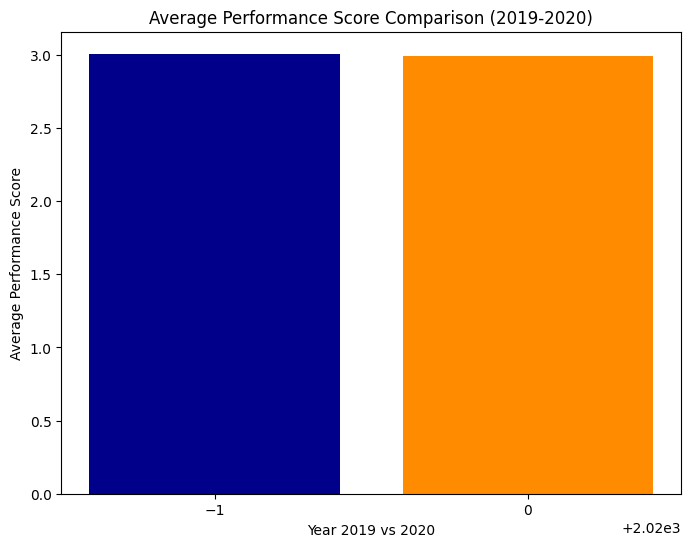

In [ ]:
# Calculate average performance score for 2019 and 2020
average_performance_2019 = employee20192020_dataset[employee20192020_dataset['Hire_Date'].dt.year == 2019]['Performance_Score'].mean()
average_performance_2020 = employee20192020_dataset[employee20192020_dataset['Hire_Date'].dt.year == 2020]['Performance_Score'].mean()

# Create the bar chart
years = [2019, 2020]
average_scores = [average_performance_2019, average_performance_2020]

plt.figure(figsize=(8, 6))
plt.bar(years, average_scores, color=['darkblue', 'darkorange'])
plt.xlabel('Year 2019 vs 2020')
plt.ylabel('Average Performance Score')
plt.title('Average Performance Score Comparison (2019-2020)')
plt.xticks(years)
plt.show()

b) Power BI visualization

In [ ]:
define_authentication = DeviceCodeLoginAuthentication()

Performing device flow authentication. Please follow the instructions below.
To sign in, use a web browser to open the page https://microsoft.com/devicelogin and enter the code FWJD777P5 to authenticate.

Device flow authentication successfully completed.
You are now logged in .

The result should be passed only to trusted code in your notebook.


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
report_PBI = QuickVisualize(get_dataset_config(employee20192020_dataset), auth=define_authentication)

In [ ]:
report_PBI


QuickVisualize()